# Tessellation dataset — 8 months, 0.5° G5NR

Rebuild of `geos5data_0.5deg.ipynb` that replaces threshold + connected-component
clustering with a **fixed equal-angle cell x hour table**.

What changes and why:

| | old notebook | this notebook |
|---|---|---|
| detector | `tb = (lwtup/σ)^0.25 < 220 K` on **broadband** OLR | `cldtmp < 220 K` **and** `cldtot > 0.5` |
| polar false positives | clear Antarctic ice emits the same OLR as an anvil | cloud-fraction gate excludes clear cold ice |
| time mapping | `.replace(day=20, month=5, year=2006)` → **24** distinct fields | walks the real hourly axis → **5880** distinct fields |
| targets | variable count per hour, no identity across time | fixed grid, stable cell id |
| `observed` | `unary_union` + geometry intersects | `sjoin` against a static cell grid |

The frame index maps **directly** onto the G5NR hourly axis, so frame `f` is
`g5nr_times[f]` — the old `_frame_ds_time` helper disappears entirely.


In [1]:
%pip install tatc pyarrow

from datetime import datetime, timezone, timedelta
import os, time as _time, gc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- configuration -------------------------------------------------------
HOURS       = 5880          # 8 months of hourly frames (245 days)
CELL_DEG    = 2.5           # target cell size; STRIDE derives from it
STRIDE      = int(CELL_DEG / 0.5)   # sample every 5th native 0.5° point
CHUNK_HOURS = 72            # hours per OpenDap request (small = server-friendly)
PAUSE       = 2.0           # seconds between requests — NCCS rate-limit courtesy
CACHE       = "g5nr_cache_tess_8mo"
GT_STEP     = timedelta(seconds=10)   # 10 s ≈ 70 km along-track, well under CELL_DEG
g5nr_frame_duration = timedelta(hours=1)   # G5NR native cadence (as in the original)
grid_size   = CELL_DEG      # box edge length; same role as the original's grid_size

# target + convection discriminators + the cloud-cover features
VARS = ["prectot",    # total precip  (reward target)
        "preccon",    # convective precip — nonzero only for real convection
        "tautot",     # total cloud optical thickness
        "cldtot",     # total cloud fraction
        "cldhgh",     # high cloud fraction
        "cldtmp",     # CLOUD-TOP temperature — the quantity the 220-235 K
                      # literature is actually about. _FillValue=1e15 where
                      # there is no cloud top, so clear sky cannot flag.
        "lwtup",      # TOA upwelling LW
        "lwtupclr"]   # clear-sky TOA upwelling LW -> cre = lwtupclr - lwtup

SMOKE_TEST = True   # True: fetch only the first 3 chunks to validate the pipeline

startdate = datetime(2025, 7, 19, 15, 4, tzinfo=timezone.utc)
print(f"{HOURS} h | {CELL_DEG}° cells | {len(VARS)} vars | chunk={CHUNK_HOURS} h")



[notice] A new release of pip is available: 26.0.1 -> 26.2.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
5880 h | 2.5° cells | 8 vars | chunk=72 h


In [2]:
from tatc import utils
from tatc.schemas import PointedInstrument, Satellite, TwoLineElements

earthcare = Satellite(
    name="EarthCare",
    orbit=TwoLineElements(tle=[
        "1 59908U 24101A   25200.34125573  .00010433  00000+0  14571-3 0  9999",
        "2 59908  97.0168 326.4971 0001222 108.6708 251.4681 15.57041891 64775",
    ]),
    instruments=[
        PointedInstrument(
            name="MSI",
            field_of_regard=utils.swath_width_to_field_of_regard(394e3, 150e3) + 2 * 5.760868,
            cross_track_field_of_view=utils.swath_width_to_field_of_view(394e3, 150e3, 5.760868),
            along_track_field_of_view=utils.swath_width_to_field_of_view(394e3, 10e3, 5.760868),
            roll_angle=5.760868,
            is_rectangular=True,
        )
    ],
)
satellites = [earthcare]


In [3]:
from tatc.analysis import compute_ground_track
from joblib import Parallel, delayed

# unchanged from the original notebook, only the time step is coarser
def compute_groundtrack(satellite, start, duration, batch_duration, time_step):
    return pd.concat(
        Parallel(-1)(
            delayed(compute_ground_track)(
                satellite,
                pd.date_range(start + i * batch_duration,
                              start + (i + 1) * batch_duration,
                              freq=time_step, inclusive="left"),
                crs="spice",
            )
            for i in range(duration // batch_duration)
            for satellite in satellites
        ),
        ignore_index=True,
    )

ground_tracks = compute_groundtrack(
    satellites[0], startdate, timedelta(hours=HOURS), timedelta(minutes=10), GT_STEP
)
print(f"{len(ground_tracks):,} ground-track footprints")
ground_tracks.head()


35,280 ground-track footprints


,geometry,time,satellite,instrument,valid_obs
0,"MULTIPOLYGON Z (((-21.95659 -23.59219 0, -21.9...",2025-07-19 15:04:00+00:00,EarthCare,MSI,True
1,"MULTIPOLYGON Z (((-34.14381 -61.87125 0, -34.1...",2025-07-19 15:14:00+00:00,EarthCare,MSI,True
2,"MULTIPOLYGON Z (((-115.48278 -83.45099 0, -115...",2025-07-19 15:24:00+00:00,EarthCare,MSI,True
3,"MULTIPOLYGON Z (((-175.56539 -76.53685 0, -175...",2025-07-19 15:34:00+00:00,EarthCare,MSI,True
4,"MULTIPOLYGON Z (((152.70694 -13.4881 0, 152.73...",2025-07-19 15:44:00+00:00,EarthCare,MSI,True


In [4]:
import xarray as xr
import rioxarray  # noqa: F401  (registers the .rio accessor)

G5NR_URL = ("https://opendap.nccs.nasa.gov/dods/OSSE/G5NR/Ganymed/7km/"
            "0.5000_deg/tavg/tavg01hr_2d_met3_Cx")

# libnetcdf waits forever on a stalled DAP transfer; HTTP.TIMEOUT turns a
# silent freeze into a catchable exception the retry loop can act on.
_dodsrc = os.path.expanduser("~/.dodsrc")
if not (os.path.exists(_dodsrc) and "HTTP.TIMEOUT" in open(_dodsrc).read()):
    with open(_dodsrc, "a") as f:
        f.write("HTTP.TIMEOUT=300\n")
    print("added HTTP.TIMEOUT=300 to ~/.dodsrc (restart kernel if DAP already used)")

def open_g5nr():
    for attempt in range(5):
        try:
            return xr.open_dataset(G5NR_URL, decode_times=True)
        except Exception as e:
            print(f"open failed {attempt + 1}/5: {e}", flush=True)
            _time.sleep(15 * (attempt + 1))
    raise RuntimeError("could not open G5NR")

dataset = open_g5nr()

# the real hourly axis. frame f == time index f — no date remapping anywhere.
g5nr_times = pd.to_datetime(dataset["time"].values)
assert HOURS <= len(g5nr_times), f"only {len(g5nr_times)} hourly slices available"
print(f"g5nr axis: {len(g5nr_times):,} slices, {g5nr_times[0]} -> {g5nr_times[-1]}")
print(f"using the first {HOURS} -> {g5nr_times[HOURS - 1]}")

# the cell grid, derived once from the strided coordinates
lat_c = dataset["lat"].values[::STRIDE]
lon_c = dataset["lon"].values[::STRIDE]
n_lat, n_lon = len(lat_c), len(lon_c)
print(f"grid: {n_lat} x {n_lon} = {n_lat * n_lon:,} cells "
      f"-> {n_lat * n_lon * HOURS:,} rows at full span")


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/xarray/coding/times.py:213: SerializationWarning: Ambiguous reference date string: 1-1-1 00:00:0.0. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1 00:00:0.0). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  ref_date = _ensure_padded_year(ref_date)


g5nr axis: 18,288 slices, 2005-05-15 21:30:00 -> 2007-06-16 20:30:00
using the first 5880 -> 2006-01-15 20:30:00
grid: 73 x 144 = 10,512 cells -> 61,810,560 rows at full span


## Fetch

One strided slab per request. Three properties keep this inside NCCS's tolerance:

- **strided** (`::STRIDE`) — asks the server for the 2.5° subsample, not the full 0.5° field
- **small chunks** — `CHUNK_HOURS` hours per request, with a `PAUSE` between them
- **checkpointed** — each chunk lands in its own parquet file, so a rerun after any
  crash resumes instead of refetching

`to_dataframe()` does the tabularization: one row per `(time, lat, lon)`.


In [5]:
os.makedirs(CACHE, exist_ok=True)

def fetch(t0, t1):
    """One bounded, strided slab. Retries with backoff, reopening the DAP handle."""
    global dataset
    for attempt in range(5):
        try:
            return (dataset[VARS]
                    .isel(time=slice(t0, t1),
                          lat=slice(None, None, STRIDE),
                          lon=slice(None, None, STRIDE))
                    .load())
        except Exception as e:
            print(f"  retry {attempt + 1}/5: {type(e).__name__}: {e}", flush=True)
            _time.sleep(min(5 * 2 ** attempt, 60))
            dataset = open_g5nr()   # a stalled connection poisons the handle
    raise RuntimeError(f"chunk {t0}:{t1} failed after 5 attempts")

starts = list(range(0, HOURS, CHUNK_HOURS))
if SMOKE_TEST:
    starts = starts[:3]
    print(f"SMOKE_TEST: {len(starts)} of {-(-HOURS // CHUNK_HOURS)} chunks\n")

_t0 = _time.time()
for ci, t0 in enumerate(starts):
    path = f"{CACHE}/cells_{ci:04d}.parquet"
    if os.path.exists(path):
        continue
    _tc = _time.time()
    sub = fetch(t0, min(t0 + CHUNK_HOURS, HOURS))
    df = sub.to_dataframe().reset_index()[["time", "lat", "lon"] + VARS]
    df[VARS] = df[VARS].astype("float32")
    df.to_parquet(path, index=False)
    print(f"chunk {ci + 1}/{len(starts)}: {len(df):,} rows, "
          f"{_time.time() - _tc:.1f}s", flush=True)
    del sub, df
    gc.collect()
    _time.sleep(PAUSE)

print(f"fetch done in {_time.time() - _t0:.1f}s")


SMOKE_TEST: 3 of 82 chunks

fetch done in 0.0s


In [6]:
import glob

files = sorted(glob.glob(f"{CACHE}/cells_*.parquet"))
cells_df = pd.concat((pd.read_parquet(f) for f in files), ignore_index=True)

# frame index == g5nr time index; recover it from the time coordinate
t_index = pd.Series(np.arange(len(g5nr_times)), index=g5nr_times)
cells_df["frame"] = t_index.reindex(cells_df["time"]).values

# ---- derived features ----
# cloud longwave radiative effect: ~0 for clear sky (including cold ice sheets),
# 60-100 W/m2 under deep convection. this is the discriminator the old
# broadband-tb threshold could not express.
cells_df["cre"] = cells_df["lwtupclr"] - cells_df["lwtup"]

# ---- detectors ----
# NEW (primary): the conventional 220 K threshold applied to the variable the
# literature is actually calibrated on, GATED BY CLOUD FRACTION.
#
# The cldtot gate is not optional. The verification cell below measured cldtmp as
# valid over 18.3% of cells with cldtot < 0.01, so cldtmp is NOT a pure cloud mask
# in this collection — it reports a value under clear sky often enough to reinstate
# the very false positive it was meant to remove. Requiring cldtot > 0.5 restores
# the "only where there is actually a cloud" property the threshold assumes.
#
# Fill handling is still free: cldtmp is _FillValue=1e15 where undefined; xarray
# masks it to NaN and `NaN < 220` is False, and unmasked `1e15 < 220` is also False.
CLDTOT_GATE = 0.5
cells_df["convective"] = ((cells_df["cldtmp"] < 220)
                          & (cells_df["cldtot"] > CLDTOT_GATE)).astype(np.int8)

# OLD: what the previous notebook called a detection. Kept so its label set stays
# exactly reproducible from this table (cells_df.old_hit == 1).
cells_df["tb_old"] = (cells_df["lwtup"] / 5.67037e-8) ** 0.25
cells_df["old_hit"] = (cells_df["tb_old"] < 220).astype(np.int8)

print(f"{len(cells_df):,} rows x {cells_df.shape[1]} cols")
cells_df.head()


2,270,592 rows x 16 cols


,time,lat,lon,prectot,preccon,tautot,cldtot,cldhgh,cldtmp,lwtup,lwtupclr,frame,cre,convective,tb_old,old_hit
0,2005-05-15 21:30:00,-90.0,-180.0,0.000005,0.0,0.959961,0.994141,0.478027,235.567169,65.690369,59.802025,0,-5.888344,0,184.489883,1
1,2005-05-15 21:30:00,-90.0,-177.5,0.000005,0.0,0.959961,0.994141,0.478027,235.567169,65.690369,59.802025,0,-5.888344,0,184.489883,1
2,2005-05-15 21:30:00,-90.0,-175.0,0.000005,0.0,0.959961,0.994141,0.478027,235.567169,65.690369,59.802025,0,-5.888344,0,184.489883,1
3,2005-05-15 21:30:00,-90.0,-172.5,0.000005,0.0,0.958984,0.994141,0.488770,235.926544,65.596619,59.692650,0,-5.903969,0,184.424026,1
4,2005-05-15 21:30:00,-90.0,-170.0,0.000005,0.0,0.959961,0.995117,0.505859,236.285919,65.502869,59.520775,0,-5.982094,0,184.358109,1


In [7]:
# ---- verify the cldtmp assumption before relying on it ----
# The whole recommendation rests on one claim: cldtmp is undefined where there is
# no cloud. If it instead reported the SURFACE temperature under clear sky, cold
# ice would still flag and the polar false positive would return. Test it directly
# against cldtot rather than trusting the .das metadata.
valid = cells_df["cldtmp"].notna() & (cells_df["cldtmp"] < 1e14)
clear = cells_df["cldtot"] < 0.01
cloudy = cells_df["cldtot"] > 0.5

print(f"cldtmp valid overall      : {100 * valid.mean():5.1f}%")
print(f"  where cldtot < 0.01     : {100 * valid[clear].mean():5.1f}%   <- expect ~0")
print(f"  where cldtot > 0.50     : {100 * valid[cloudy].mean():5.1f}%   <- expect high")
print(f"  polar (|lat|>75) valid  : {100 * valid[cells_df.lat.abs() > 75].mean():5.1f}%")
if valid.any():
    print(f"\ncldtmp range where valid  : "
          f"{cells_df.loc[valid, 'cldtmp'].min():.1f} - "
          f"{cells_df.loc[valid, 'cldtmp'].max():.1f} K")
ASSUMPTION_HOLDS = valid[clear].mean() < 0.05
print(f"\nraw cldtmp is a pure cloud mask: {ASSUMPTION_HOLDS}")
if not ASSUMPTION_HOLDS:
    print(f"  -> it is NOT ({100 * valid[clear].mean():.1f}% valid under clear sky), which is\n"
          f"     why the detector above gates on cldtot > {CLDTOT_GATE}.")

# what the gate actually removes
_raw = cells_df["cldtmp"] < 220
_gated = _raw & (cells_df["cldtot"] > CLDTOT_GATE)
print(f"\ncells flagged by cldtmp<220 alone : {int(_raw.sum()):,}")
print(f"cells surviving the cldtot gate   : {int(_gated.sum()):,} "
      f"({100 * _gated.sum() / max(int(_raw.sum()), 1):.1f}% kept)")
_pol = cells_df.lat.abs() > 75
print(f"  of polar (|lat|>75) flags: {int(_raw[_pol].sum()):,} -> {int(_gated[_pol].sum()):,}")


cldtmp valid overall      :  86.8%
  where cldtot < 0.01     :  18.3%   <- expect ~0
  where cldtot > 0.50     :  92.7%   <- expect high
  polar (|lat|>75) valid  :  63.3%

cldtmp range where valid  : 186.8 - 301.3 K

raw cldtmp is a pure cloud mask: False
  -> it is NOT (18.3% valid under clear sky), which is
     why the detector above gates on cldtot > 0.5.

cells flagged by cldtmp<220 alone : 277,460
cells surviving the cldtot gate   : 261,447 (94.2% kept)
  of polar (|lat|>75) flags: 14,778 -> 14,671


In [8]:
# ---- observed label: exact geometric intersection ----
# IMPORTANT: compute_ground_track returns one row per 10-MINUTE pass, stored as a
# MULTIPOLYGON spanning ~4,000 km of orbit — NOT a small per-timestep footprint.
# (Cell 3: consecutive rows are 10 minutes apart.) Bounding-box binning is invalid
# here — the bbox of a 4,000 km multipolygon is enormous and its corners fall
# nowhere near the actual swath, which undercounted coverage roughly 4x.
import geopandas as gpd
from shapely.geometry import box

ground_tracks["frame"] = ((ground_tracks.time - startdate) // g5nr_frame_duration).astype(int)

# static cell grid, built once and reused
cell_boxes = gpd.GeoDataFrame(
    {"ci": np.repeat(np.arange(n_lat), n_lon),
     "cj": np.tile(np.arange(n_lon), n_lat)},
    geometry=[box(x, y, x + CELL_DEG, y + CELL_DEG) for y in lat_c for x in lon_c],
    crs="EPSG:4326",
)

def key(f, i, j):
    return (np.asarray(f, dtype=np.int64) * n_lat + np.asarray(i)) * n_lon + np.asarray(j)

# join only the frames actually fetched
frames_have = np.sort(cells_df["frame"].unique())
gt_sub = ground_tracks.loc[ground_tracks.frame.isin(frames_have), ["geometry", "frame"]]
pairs = gpd.sjoin(cell_boxes, gt_sub, how="inner", predicate="intersects")
seen = np.unique(key(pairs["frame"].values, pairs["ci"].values, pairs["cj"].values))

ci_ = np.clip(((cells_df["lat"] - lat_c[0]) / CELL_DEG).round().astype(np.int64), 0, n_lat - 1)
cj_ = np.clip(((cells_df["lon"] - lon_c[0]) / CELL_DEG).round().astype(np.int64), 0, n_lon - 1)
cells_df["observed"] = np.isin(key(cells_df["frame"].values, ci_, cj_), seen).astype(np.int8)

_per = cells_df.groupby("frame")["observed"].sum()
print(f"observed: {int(cells_df.observed.sum()):,} / {len(cells_df):,} "
      f"({100 * cells_df.observed.mean():.2f}%)")
print(f"cells per frame: mean {_per.mean():.1f}, min {_per.min()}, max {_per.max()}")
print(f"sanity: a 150 km swath over ~27,000 km of hourly track should touch "
      f"~{27000 / (CELL_DEG * 111):.0f}+ cells/hr on a {CELL_DEG}° grid")


observed: 62,547 / 2,270,592 (2.75%)
cells per frame: mean 289.6, min 255, max 356
sanity: a 150 km swath over ~27,000 km of hourly track should touch ~97+ cells/hr on a 2.5° grid


## Diagnostic — does this actually fix the polar false positives?

Both detectors are applied to the same cells and scored against `preccon`, which is
convective precipitation as a **stored model field** rather than a radiative proxy.

- `old_dry_%` — of the cells the **broadband** detector called deep convection, the
  fraction with *zero* convective precipitation
- `new_dry_%` — the same for the **cloud-top-temperature** detector

If the argument in `docs/method_rationale.md` is right, `old_dry_%` climbs toward 100%
poleward of ~45° while `new_dry_%` stays low. If both stay low, the original method was
fine and the redesign is unnecessary — the table is written so that outcome is visible
rather than hidden.


In [9]:
# Three detectors on identical cells. `dry` = no convective precipitation at all,
# so "<det>_dry_%" is that detector's false-positive rate.
band = pd.cut(cells_df.lat, [-90, -75, -45, -15, 15, 45, 75, 90],
              labels=["<-75", "-75:-45", "-45:-15", "tropics", "15:45", "45:75", ">75"],
              include_lowest=True)  # else the lat=-90 row silently drops out

dry = cells_df.preccon <= 1e-8
old = cells_df.old_hit.astype(bool)      # broadband  tb   < 220 K
new = cells_df.convective.astype(bool)   # cloud-top cldtmp < 220 K

def rate(flag):
    return 100 * flag.groupby(band, observed=True).mean()

def fp(flag):
    return 100 * dry[flag].groupby(band[flag], observed=True).mean()

rep = pd.DataFrame({
    "cells":       cells_df.groupby(band, observed=True).size(),
    "old_flag_%":  rate(old),
    "old_dry_%":   fp(old),
    "new_flag_%":  rate(new),
    "new_dry_%":   fp(new),
    "mean_cre":    cells_df.cre.groupby(band, observed=True).mean(),
})
display(rep.round(2))

print("old_dry_% vs new_dry_% is the whole argument: if the cldtmp detector is")
print("sound, new_dry_% stays low at high latitude where old_dry_% approaches 100.")
print(f"\npoleward of 45 deg — old: {100 * dry[old & (cells_df.lat.abs() > 45)].mean():.1f}%"
      f"   new: {100 * dry[new & (cells_df.lat.abs() > 45)].mean():.1f}%")


,cells,old_flag_%,old_dry_%,new_flag_%,new_dry_%,mean_cre
lat,,,,,,
<-75,217728,53.91,100.00,7.63,99.99,3.230000
-75:-45,373248,3.85,97.43,15.36,95.54,30.940001
-45:-15,373248,0.61,50.71,9.24,59.10,27.360001
tropics,373248,1.06,3.48,20.64,11.71,31.570000
15:45,373248,0.42,45.11,12.70,63.79,27.799999
45:75,373248,0.48,82.95,7.05,85.57,26.820000
>75,186624,0.46,96.88,1.18,100.00,18.620001


old_dry_% vs new_dry_% is the whole argument: if the cldtmp detector is
sound, new_dry_% stays low at high latitude where old_dry_% approaches 100.

poleward of 45 deg — old: 99.5%   new: 94.1%


In [10]:
# ---- final training table ----
# no threshold anywhere: every cell-hour is a row. the positive class is set by
# percentile, so the imbalance ratio is a dial rather than an artifact of 220 K.
Q = 0.99
cells_df["high_precip"] = (cells_df.prectot > cells_df.prectot.quantile(Q)).astype(np.int8)

out = "tessellation_8mo.parquet"
cells_df.to_parquet(out, index=False)

print(f"saved {out}: {len(cells_df):,} rows")
print(f"positive class at q={Q}: {cells_df.high_precip.sum():,} "
      f"({100 * cells_df.high_precip.mean():.2f}%)")
print(f"observed & high_precip : {int((cells_df.observed & cells_df.high_precip).sum()):,}")
print(f"\ndistinct atmospheric states: {cells_df.frame.nunique():,}  "
      f"(old notebook: 24)")
cells_df.describe().T


saved tessellation_8mo.parquet: 2,270,592 rows
positive class at q=0.99: 22,705 (1.00%)
observed & high_precip : 408

distinct atmospheric states: 216  (old notebook: 24)


,count,mean,min,25%,50%,75%,max,std
time,2270592,2005-05-20 08:59:59.999999744,2005-05-15 21:30:00,2005-05-18 03:15:00,2005-05-20 09:00:00,2005-05-22 14:45:00,2005-05-24 20:30:00,NaN
lat,2270592.0,0.0,-90.0,-45.0,0.0,45.0,90.0,52.67828
lon,2270592.0,-1.25,-180.0,-90.625,-1.25,88.125,177.5,103.920565
prectot,2270592.0,0.00003,0.0,0.0,0.000002,0.000012,0.018463,0.000165
preccon,2270592.0,0.000003,0.0,0.0,0.0,0.0,0.001999,0.000016
tautot,2270592.0,21.247017,0.0,1.660156,12.78125,31.125,303.498718,25.701221
cldtot,2270592.0,0.689888,0.0,0.447266,0.855469,0.976562,1.0,0.348323
cldhgh,2270592.0,0.361406,0.0,0.0,0.080933,0.866211,0.994141,0.410349
cldtmp,1970389.0,248.286179,186.763062,227.458282,247.533752,267.861084,301.26532,23.838718
lwtup,2270592.0,222.763382,50.010685,183.812225,228.385956,266.463593,385.415131,52.858318


---

## Parity layer — same tables, same figures, corrected detector

Everything below reproduces the original notebook's `clusters` and `aggregated_observed`
tables **column for column**, and its figures, so the two datasets are directly comparable.
The only change is the detector: objects are grown from `cldtmp < 220` instead of
`(lwtup/σ)^0.25 < 220`.

Objects are built at `CELL_DEG` (2.5°) rather than the original 0.5°, so components are
coarser. Set `STRIDE = 1` to rebuild at native resolution at ~25× the transfer cost.

In [11]:
import scipy.ndimage as ndi
import geopandas as gpd
from shapely.geometry import box

def compute_grid_cell_area(lat, lon):
    """Identical to cell 7 of the original notebook."""
    R = 6371.0
    d2r = np.pi / 180.0
    ny, nx = len(lat), len(lon)
    dlat = abs(lat[1] - lat[0]) if len(lat) > 1 else 1.0
    dlon = abs(lon[1] - lon[0]) if len(lon) > 1 else 1.0
    lat_rad, dlat_rad, dlon_rad = lat * d2r, dlat * d2r, dlon * d2r
    area = np.zeros((ny, nx))
    for i in range(ny):
        area[i, :] = (R**2) * dlon_rad * (np.sin(lat_rad[i] + dlat_rad / 2)
                                          - np.sin(lat_rad[i] - dlat_rad / 2))
    return area

area_2d = compute_grid_cell_area(lat_c, lon_c)
print(f"area grid {area_2d.shape}, {area_2d.min():.0f}-{area_2d.max():.0f} km2 per cell")


area grid (73, 144), 0-77271 km2 per cell


In [12]:
# ---- grow objects from the cldtmp mask -> same schema as the original `clusters` ----
# NOTE: ndi.label does not wrap at the antimeridian, matching the original notebook's
# behaviour so the two datasets stay comparable. Objects straddling +/-180 are split.
det = cells_df[cells_df.convective == 1].copy()
det["i"] = ((det.lat - lat_c[0]) / CELL_DEG).round().astype(int)
det["j"] = ((det.lon - lon_c[0]) / CELL_DEG).round().astype(int)
det["cluster"] = 0

for f, g in det.groupby("frame", sort=True):
    m = np.zeros((n_lat, n_lon), dtype=bool)
    m[g.i.values, g.j.values] = True
    lab, _ = ndi.label(m)
    det.loc[g.index, "cluster"] = lab[g.i.values, g.j.values]

# per-cell rows, then dissolve — mirrors the original construction exactly
det["area"] = area_2d[det.i.values, det.j.values]
det["count"] = 1
# tz-aware UTC on the ground-track clock, as in the original notebook
det["time"] = startdate + det["frame"] * g5nr_frame_duration
for c in ("tot_prectot", "avg_prectot", "max_prectot"):
    det[c] = det["prectot"]
# preccon carried alongside — the original schema plus convective precipitation,
# which is the variable that actually distinguishes convection from drizzle/snow
for c in ("tot_preccon", "avg_preccon", "max_preccon"):
    det[c] = det["preccon"]

cells_gdf = gpd.GeoDataFrame(
    det, crs="EPSG:4326",
    geometry=[box(lo, la, lo + CELL_DEG, la + CELL_DEG)
              for lo, la in zip(det.lon.values, det.lat.values)],
)

clusters = cells_gdf[cells_gdf.cluster > 0].dissolve(
    by=["time", "cluster"],
    aggfunc={"count": "sum", "area": "sum", "tot_prectot": "sum",
             "avg_prectot": "mean", "max_prectot": "max",
             "tot_preccon": "sum", "avg_preccon": "mean", "max_preccon": "max"},
).reset_index()

print(f"{len(clusters):,} cluster rows from {len(det):,} detected cells")
display(clusters.head())


59,862 cluster rows from 261,447 detected cells


,time,cluster,geometry,count,area,tot_prectot,avg_prectot,max_prectot,tot_preccon,avg_preccon,max_preccon
0,2025-07-19 15:04:00+00:00,1,"POLYGON ((-50 -82.5, -47.5 -82.5, -47.5 -85, -...",9,7.736771e+04,5.630632e-05,6.256258e-06,2.655387e-05,0.0,0.0,0.0
1,2025-07-19 15:04:00+00:00,2,"POLYGON ((-77.5 -82.5, -77.5 -80, -75 -80, -72...",3,3.025760e+04,1.128064e-07,3.760215e-08,9.173527e-08,0.0,0.0,0.0
2,2025-07-19 15:04:00+00:00,3,"POLYGON ((-150 -72.5, -147.5 -72.5, -145 -72.5...",58,1.507926e+06,7.814944e-03,1.347404e-04,8.945465e-04,0.0,0.0,0.0
3,2025-07-19 15:04:00+00:00,4,"POLYGON ((-72.5 -77.5, -72.5 -75, -75 -75, -75...",1,1.672447e+04,4.678965e-06,4.678965e-06,4.678965e-06,0.0,0.0,0.0
4,2025-07-19 15:04:00+00:00,5,"POLYGON ((-165 -75, -165 -72.5, -167.5 -72.5, ...",14,3.283164e+05,8.962601e-04,6.401858e-05,2.231598e-04,0.0,0.0,0.0


In [13]:
# ---- solar_hour: identical computation to cell 9 of the original ----
from skyfield.api import wgs84
from tatc.constants import de421, timescale

frame_duration = timedelta(minutes=10)   # same name/roleas the original notebook

_cent = clusters.geometry.centroid
clusters["solar_hour"] = [
    (de421["earth"] + wgs84.latlon(y, x))
    .at(timescale.from_datetime(t + g5nr_frame_duration / 2))
    .observe(de421["sun"]).apparent().hadec()[0].hours + 12
    for y, x, t in zip(_cent.y, _cent.x, clusters.time)
]
print(f"solar_hour {clusters.solar_hour.min():.1f} - {clusters.solar_hour.max():.1f}")


/var/folders/nr/g7vyljz92cn916tbpfvq60h00000gn/T/ipykernel_91665/1701751078.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  _cent = clusters.geometry.centroid


solar_hour 0.0 - 24.0


In [14]:
# ---- observed on clusters: a cluster is observed if any member cell was in-swath ----
det["observed_cell"] = cells_df["observed"].reindex(det.index).fillna(0).astype(int)
obs_by = det[det.cluster > 0].groupby(["time", "cluster"])["observed_cell"].max()
clusters["observed"] = (
    obs_by.reindex(pd.MultiIndex.from_arrays([clusters.time, clusters.cluster]))
    .fillna(0).astype(int).values
)
clusters["frame"] = ((clusters.time - startdate) // g5nr_frame_duration).astype(int)

# tautot per ground-track pass, read from the cell table (no extra OpenDap request)
_key = key(cells_df["frame"].to_numpy().astype(np.int64), ci_, cj_)
_tau = pd.Series(cells_df["tautot"].values, index=_key)
_tau = _tau[~_tau.index.duplicated()]
# tautot per pass = mean over the cells that pass actually intersects
_pk = key(pairs["frame"].values, pairs["ci"].values, pairs["cj"].values)
_pt = pd.DataFrame({"gt": pairs["index_right"].values, "tau": _tau.reindex(_pk).values})
ground_tracks["tautot"] = (_pt.groupby("gt")["tau"].mean()
                           .reindex(ground_tracks.index).values)

print(f"observed clusters: {int(clusters.observed.sum()):,} / {len(clusters):,}")


observed clusters: 2,083 / 59,862


In [15]:
# ---- aggregated_observed: one row per 10-minute pass. Same columns as the original. ----
observed_clusters = clusters[clusters["observed"] == 1].copy()
observed_clusters["lat"] = observed_clusters.geometry.centroid.y
observed_clusters["lon"] = observed_clusters.geometry.centroid.x

joined_observed = gpd.sjoin(observed_clusters, ground_tracks,
                            how="right", predicate="intersects", on_attribute="frame")

_agg = pd.DataFrame(joined_observed).groupby(level=0).agg(
    geometry=("geometry", "first"), frame=("frame", "first"),
    satellite=("satellite", "first"), tautot=("tautot", "first"),
    lat=("lat", "mean"), lon=("lon", "mean"), solar_hour=("solar_hour", "mean"),
    count=("count", "sum"), area=("area", "sum"),
    tot_prectot=("tot_prectot", "sum"), avg_prectot=("avg_prectot", "mean"),
    max_prectot=("max_prectot", "max"),
    tot_preccon=("tot_preccon", "sum"), avg_preccon=("avg_preccon", "mean"),
    max_preccon=("max_preccon", "max"),
)
_agg["frame"] = ground_tracks["frame"]
_agg["time"] = pd.to_datetime(startdate + _agg["frame"] * g5nr_frame_duration, utc=True)
_agg["lat"] = _agg["lat"].fillna(ground_tracks.geometry.centroid.y)
_agg["lon"] = _agg["lon"].fillna(ground_tracks.geometry.centroid.x)
_agg["solar_hour"] = _agg["solar_hour"].fillna(
    (_agg["time"].dt.hour + _agg["time"].dt.minute / 60 + _agg["lon"] / 15) % 24)
for c in ["count", "area", "tot_prectot", "avg_prectot", "max_prectot",
          "tot_preccon", "avg_preccon", "max_preccon"]:
    _agg[c] = _agg[c].fillna(0)
_agg["observed"] = (_agg["count"] > 0).astype(int)

aggregated_observed = gpd.GeoDataFrame(_agg, geometry="geometry", crs=ground_tracks.crs)
display(aggregated_observed.head())
print(len(aggregated_observed), "total passes;",
      int(aggregated_observed.observed.sum()), "observed")


/var/folders/nr/g7vyljz92cn916tbpfvq60h00000gn/T/ipykernel_91665/794145440.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  observed_clusters["lat"] = observed_clusters.geometry.centroid.y
/var/folders/nr/g7vyljz92cn916tbpfvq60h00000gn/T/ipykernel_91665/794145440.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  observed_clusters["lon"] = observed_clusters.geometry.centroid.x
/var/folders/nr/g7vyljz92cn916tbpfvq60h00000gn/T/ipykernel_91665/794145440.py:21: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  _agg["lat"] = _agg["lat"].fillna(ground_tracks.geometry.centroid.

,geometry,frame,satellite,tautot,lat,lon,solar_hour,count,area,tot_prectot,avg_prectot,max_prectot,tot_preccon,avg_preccon,max_preccon,time,observed
0,"MULTIPOLYGON Z (((-21.95659 -23.59219 0, -21.9...",0,EarthCare,18.636335,0.220257,-35.459807,13.096703,316.0,2.411652e+07,0.055076,0.000123,0.003311,0.017713,0.000028,0.000288,2025-07-19 15:04:00+00:00,1
1,"MULTIPOLYGON Z (((-34.14381 -61.87125 0, -34.1...",0,EarthCare,27.965672,-45.429331,-27.894585,13.207028,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2025-07-19 15:04:00+00:00,0
2,"MULTIPOLYGON Z (((-115.48278 -83.45099 0, -115...",0,EarthCare,2.928342,-75.787037,-54.490741,11.827938,15.0,2.055935e+05,0.000104,0.000007,0.000027,0.000000,0.000000,0.000000,2025-07-19 15:04:00+00:00,1
3,"MULTIPOLYGON Z (((-175.56539 -76.53685 0, -175...",0,EarthCare,9.848758,-62.447163,123.401565,23.293438,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2025-07-19 15:04:00+00:00,0
4,"MULTIPOLYGON Z (((152.70694 -13.4881 0, 152.73...",0,EarthCare,36.745502,-19.990975,141.001805,8.860749,556.0,4.199968e+07,0.062483,0.000064,0.004547,0.021880,0.000030,0.000153,2025-07-19 15:04:00+00:00,1


35280 total passes; 1069 observed


In [16]:
# ---- of the OBSERVED passes, how many carry SIGNIFICANT convective precip? ----
# Units: preccon/prectot are kg m-2 s-1. Since 1 kg m-2 == 1 mm of water,
# 1 kg m-2 s-1 == 1 mm s-1, so  mm/hr = value * 3600.
#
# Why a ladder rather than one number: in a model field "> 0" is nearly
# meaningless — G5NR produces trace drizzle almost everywhere. In the ORIGINAL
# dataset every one of the 11,837 observed passes had avg_prectot > 0 (100%),
# so that test carried no information at all. Rates below are the conventional
# light / moderate / heavy bands.
MMHR = 3600.0
obs = aggregated_observed[aggregated_observed.observed == 1]

print(f"total passes    : {len(aggregated_observed):>7,}")
print(f"observed passes : {len(obs):>7,}  "
      f"({len(obs) / max(len(aggregated_observed), 1):.1%} of all passes)\n")

print(f"{'':<26}{'convective (preccon)':>22}{'total (prectot)':>20}")
print(f"{'threshold (peak in pass)':<26}{'':>22}{'':>20}")
for name, mmhr in [("any  > 0", 0.0), ("light    >= 0.1 mm/hr", 0.1),
                   ("moderate >= 1 mm/hr", 1.0), ("heavy    >= 10 mm/hr", 10.0)]:
    t = mmhr / MMHR
    a = int((obs.max_preccon > t).sum())
    b = int((obs.max_prectot > t).sum())
    d = max(len(obs), 1)
    print(f"  {name:<24}{a:>8,} ({100 * a / d:5.1f}%){b:>10,} ({100 * b / d:5.1f}%)")

# convective share of total precipitation, where it rains at all
rain = obs[obs.max_prectot > 0.1 / MMHR]
if len(rain):
    frac = (rain.max_preccon / rain.max_prectot).clip(0, 1)
    print(f"\nconvective share of peak precip (passes with >=0.1 mm/hr total):")
    print(f"  median {frac.median():.2f} | mean {frac.mean():.2f} | "
          f">50% convective: {int((frac > 0.5).sum()):,} passes")

sig = int((obs.max_preccon > 1.0 / MMHR).sum())
print(f"\nANSWER: {sig:,} of {len(obs):,} observed passes ({100 * sig / max(len(obs),1):.1f}%) "
      f"reach >=1 mm/hr convective precipitation.")


total passes    :  35,280
observed passes :   1,069  (3.0% of all passes)

                            convective (preccon)     total (prectot)
threshold (peak in pass)                                            
  any  > 0                     679 ( 63.5%)     1,069 (100.0%)
  light    >= 0.1 mm/hr        369 ( 34.5%)       804 ( 75.2%)
  moderate >= 1 mm/hr           53 (  5.0%)       509 ( 47.6%)
  heavy    >= 10 mm/hr           0 (  0.0%)        92 (  8.6%)

convective share of peak precip (passes with >=0.1 mm/hr total):
  median 0.03 | mean 0.11 | >50% convective: 61 passes

ANSWER: 53 of 1,069 observed passes (5.0%) reach >=1 mm/hr convective precipitation.


In [17]:
# ---- RL problem framing: MSI features -> CPR on/off -> checked against precip ----
# The agent sees only what MSI can measure at decision time and chooses whether to
# power up the CPR. Correctness is scored afterwards against prectot/preccon, which
# the agent must NEVER observe — those are the label, not a feature.
MSI_FEATURES = ["tautot", "cldtot", "cldhgh", "cldtmp", "lwtup", "cre",
                "solar_hour", "lat", "lon"]          # observable from orbit
LABEL_ONLY   = ["prectot", "preccon", "tot_prectot", "avg_prectot", "max_prectot",
                "tot_preccon", "avg_preccon", "max_preccon"]   # CPR / ground truth

leak = set(MSI_FEATURES) & set(LABEL_ONLY)
assert not leak, f"LEAKAGE: {leak} is both feature and label"
print(f"{len(MSI_FEATURES)} observable features | {len(LABEL_ONLY)} label-only columns")

# per-pass MSI features: mean over the cells each pass actually intersects
_f = cells_df.set_index(key(cells_df["frame"].values, ci_, cj_))
_pk = key(pairs["frame"].values, pairs["ci"].values, pairs["cj"].values)
_pf = _f.reindex(_pk)[["tautot", "cldtot", "cldhgh", "cldtmp", "lwtup", "cre",
                       "prectot", "preccon"]].reset_index(drop=True)
_pf["gt"] = pairs["index_right"].values
per_pass = _pf.groupby("gt").agg(
    tautot=("tautot", "mean"), cldtot=("cldtot", "mean"), cldhgh=("cldhgh", "mean"),
    cldtmp=("cldtmp", "min"), lwtup=("lwtup", "mean"), cre=("cre", "max"),
    prectot=("prectot", "max"), preccon=("preccon", "max"),
)
print(f"per-pass table: {len(per_pass):,} passes x {per_pass.shape[1]} cols")

# is the decision learnable? AUC of each observable feature against the CPR-worth label
MM = 3600.0
def auc(score, y):
    m = np.isfinite(score); s, yy = score[m], np.asarray(y)[m]
    if yy.sum() == 0 or yy.sum() == len(yy):
        return float("nan")
    r = pd.Series(s).rank().values
    npos = yy.sum(); nneg = len(yy) - npos
    return (r[yy == 1].sum() - npos * (npos + 1) / 2) / (npos * nneg)

y = (per_pass.prectot > 1.0 / MM).astype(int).values
print(f"\nCPR-worth label (peak prectot >= 1 mm/hr): {y.sum():,} of {len(y):,} "
      f"passes ({100 * y.mean():.1f}%)")
print("\nsingle-feature skill (AUC; <0.5 means the feature predicts inversely):")
for f in ["tautot", "cldtot", "cldhgh", "cldtmp", "lwtup", "cre"]:
    a = auc(per_pass[f].values.astype(float), y)
    print(f"  {f:<9}{a:6.3f}   {'(inverted: %.3f)' % (1 - a) if a < 0.5 else ''}")
print("\nAn agent can only learn this decision if some observable feature separates the")
print("classes. tautot and cre carrying real skill is what makes CPR gating tractable.")


9 observable features | 8 label-only columns
per-pass table: 1,296 passes x 8 cols

CPR-worth label (peak prectot >= 1 mm/hr): 507 of 1,296 passes (39.1%)

single-feature skill (AUC; <0.5 means the feature predicts inversely):
  tautot    0.713   
  cldtot    0.581   
  cldhgh    0.633   
  cldtmp    0.402   (inverted: 0.598)
  lwtup     0.514   
  cre       0.703   

An agent can only learn this decision if some observable feature separates the
classes. tautot and cre carrying real skill is what makes CPR gating tractable.


NEW detector — observed clusters by latitude band (total 2,083):
  south polar  (<= -75)     200 (  9.6%)
  antarctic    (-75:-60)     221 ( 10.6%)
  S mid-lat    (-60:-30)     300 ( 14.4%)
  S tropics    (-30:  0)     260 ( 12.5%)
  N tropics    (  0: 30)     445 ( 21.4%)
  N mid-lat    ( 30: 60)     430 ( 20.6%)
  arctic       ( 60: 75)     164 (  7.9%)
  north polar  (>  75)      63 (  3.0%)

median |lat|: 43.8   (original: 39.7 -> should be near 0)
tropical share |lat|<30: 33.8%   (original: 39.0%)


/var/folders/nr/g7vyljz92cn916tbpfvq60h00000gn/T/ipykernel_91665/779009861.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  lats = clusters[clusters.observed == 1].geometry.centroid.y


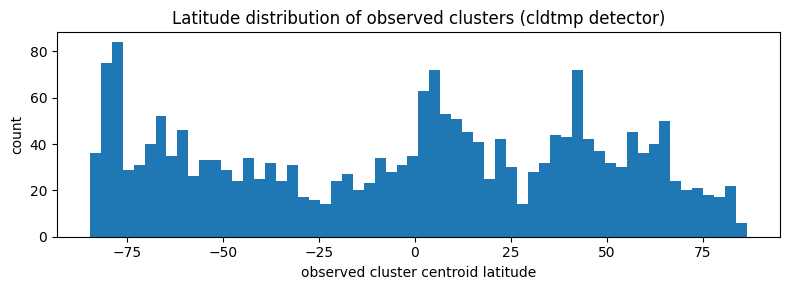

In [18]:
# ---- the decisive comparison: latitude distribution, old detector vs new ----
# Original notebook (stored output, 19,290 observed clusters):
#   antarctic -75:-60  30.5% | S mid 25.4% | S trop 18.7% | N trop 20.3% | N mid 1.7%
# Deep convection should peak in the TROPICS. It did not.
lats = clusters[clusters.observed == 1].geometry.centroid.y
bands = [("south polar  (<= -75)", lats <= -75),
         ("antarctic    (-75:-60)", (lats > -75) & (lats <= -60)),
         ("S mid-lat    (-60:-30)", (lats > -60) & (lats <= -30)),
         ("S tropics    (-30:  0)", (lats > -30) & (lats <= 0)),
         ("N tropics    (  0: 30)", (lats > 0) & (lats <= 30)),
         ("N mid-lat    ( 30: 60)", (lats > 30) & (lats <= 60)),
         ("arctic       ( 60: 75)", (lats > 60) & (lats <= 75)),
         ("north polar  (>  75)",   lats > 75)]
print(f"NEW detector — observed clusters by latitude band (total {len(lats):,}):")
for name, m in bands:
    print(f"  {name}  {int(m.sum()):6d} ({100 * m.mean():5.1f}%)")
print(f"\nmedian |lat|: {lats.abs().median():.1f}   (original: 39.7 -> should be near 0)")
print(f"tropical share |lat|<30: {100 * (lats.abs() < 30).mean():.1f}%   (original: 39.0%)")

fig, ax = plt.subplots(figsize=(8, 3))
ax.hist(lats, bins=60)
ax.set_xlabel("observed cluster centroid latitude"); ax.set_ylabel("count")
ax.set_title("Latitude distribution of observed clusters (cldtmp detector)")
plt.tight_layout(); plt.show()


In [19]:
# ---- figure parity: cluster animation coloured by `observed` (original cell 11) ----
import matplotlib.animation as animation
from cartopy import crs as ccrs
from matplotlib.patches import Patch
from IPython.display import HTML

N_ANIM = min(120, int(clusters.frame.max()) + 1)   # cap frames to keep the html small
fig, ax = plt.subplots(figsize=(8, 4), subplot_kw={"projection": ccrs.PlateCarree()})

def animate(frame):
    ax.clear()
    time = startdate + frame * g5nr_frame_duration
    ac = clusters[(clusters.time >= time) & (clusters.time < time + g5nr_frame_duration)]
    if not ac.empty:
        ac.plot(ax=ax, column="observed", vmin=0, vmax=1, cmap="RdYlGn")
    tr = ground_tracks[(ground_tracks.time >= time)
                       & (ground_tracks.time < time + g5nr_frame_duration)]
    if not tr.empty:
        tr.dissolve().plot(ax=ax, color="black", alpha=1)
    ax.set_global(); ax.set_aspect("equal"); ax.coastlines(); ax.set_title(time)
    plt.legend(handles=[Patch(label="MSI", facecolor="black", alpha=1),
                        Patch(label="Unobserved", facecolor="#A50026"),
                        Patch(label="Observed", facecolor="#006837")], loc="lower right")

ani = animation.FuncAnimation(fig, animate, frames=N_ANIM, interval=100, blit=False)
display(HTML(ani.to_jshtml())); plt.close()



[notice] A new release of pip is available: 26.0.1 -> 26.2.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


/var/folders/nr/g7vyljz92cn916tbpfvq60h00000gn/T/ipykernel_91665/1445056199.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  agg["centroid"] = agg.geometry.centroid
/var/folders/nr/g7vyljz92cn916tbpfvq60h00000gn/T/ipykernel_91665/1445056199.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  flat = pd.DataFrame({"lon": agg.centroid.x, "lat": agg.centroid.y,
/var/folders/nr/g7vyljz92cn916tbpfvq60h00000gn/T/ipykernel_91665/1445056199.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gt = ground_tracks.copy(); gt["centroid"] = gt.geometry.centroid
/var/folders/nr/g7vyl

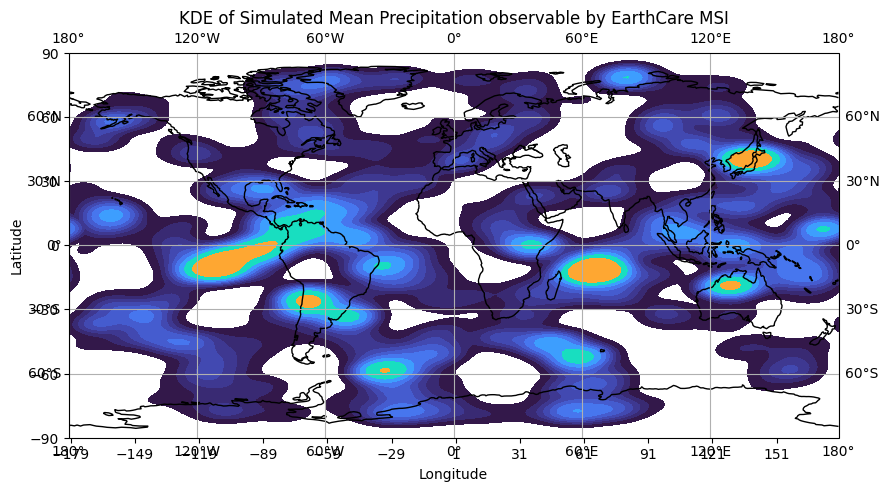

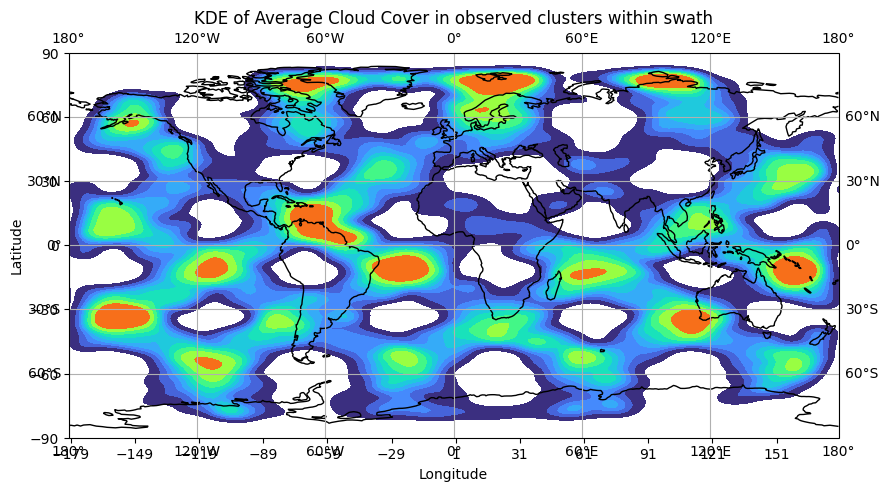

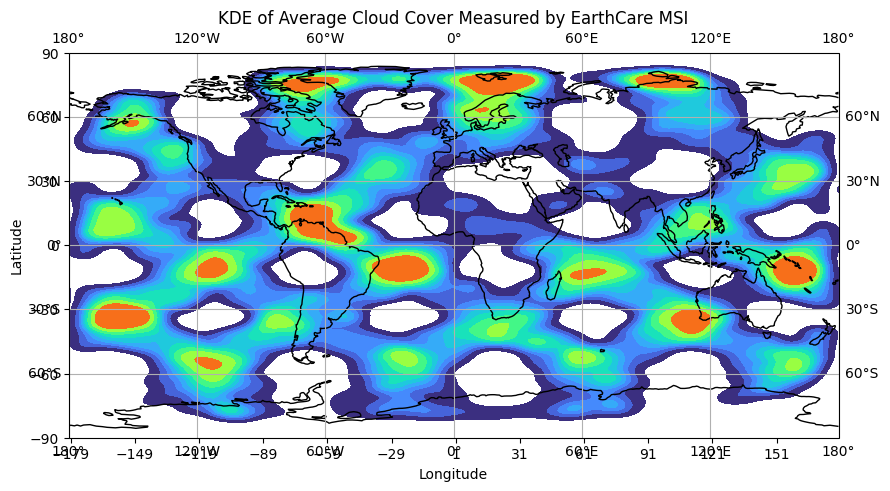

In [20]:
# ---- figure parity: KDE maps (original cells 17, 18, 19) ----
%pip install seaborn
import seaborn as sns

agg = aggregated_observed.copy()
agg["centroid"] = agg.geometry.centroid
flat = pd.DataFrame({"lon": agg.centroid.x, "lat": agg.centroid.y,
                     "avg_prectot": agg.avg_prectot, "tautot": agg.tautot})
gt = ground_tracks.copy(); gt["centroid"] = gt.geometry.centroid
flat_gt = pd.DataFrame({"lon": gt.centroid.x, "lat": gt.centroid.y, "tautot": gt.tautot})

panels = [
    (flat, "avg_prectot", "KDE of Simulated Mean Precipitation observable by EarthCare MSI"),
    (flat, "tautot",      "KDE of Average Cloud Cover in observed clusters within swath"),
    (flat_gt, "tautot",   "KDE of Average Cloud Cover Measured by EarthCare MSI"),
]
for data, w, title in panels:
    d = data.dropna(subset=[w])
    d = d[d[w] > 0]
    if d.empty:
        print(f"skipped (no positive weights): {title}"); continue
    fig, ax = plt.subplots(figsize=(10, 5), subplot_kw={"projection": ccrs.PlateCarree()})
    sns.kdeplot(data=d, x="lon", y="lat", weights=w, fill=True,
                cmap="turbo", bw_adjust=0.2, ax=ax)
    ax.coastlines(); ax.set_xlim(-180, 180); ax.set_ylim(-90, 90)
    ax.set_title(title); ax.set_xlabel("Longitude"); ax.set_ylabel("Latitude")
    ax.set_xticks(range(-179, 179, 30)); ax.set_yticks(range(-90, 91, 30))
    ax.gridlines(draw_labels=True)
    plt.show()


In [22]:
# ---- export parity (original cell 25) ----
export_gdf = aggregated_observed.copy()
if pd.api.types.is_datetime64_any_dtype(export_gdf["time"]):
    export_gdf["time"] = export_gdf["time"].dt.strftime("%Y-%m-%dT%H:%M:%SZ")
if pd.api.types.is_timedelta64_dtype(export_gdf["solar_hour"]):
    export_gdf["solar_hour"] = export_gdf["solar_hour"].dt.total_seconds() / 3600.0
if export_gdf.crs is None or export_gdf.crs.to_epsg() != 4326:
    export_gdf = export_gdf.to_crs("EPSG:4326")

export_path = "observedclusters_tessellation_8months.geojson"
export_gdf.to_file(export_path, driver="GeoJSON")
print(f"wrote {len(export_gdf)} features to {export_path}")

print(f"\nall ground-track passes: {len(ground_tracks):>6}")
print(f"observed-only passes:    {int(aggregated_observed.observed.sum()):>6}")
print(f"observed fraction:       "
      f"{aggregated_observed.observed.sum() / len(ground_tracks):.1%}")


wrote 35280 features to observedclusters_tessellation_8months.geojson

all ground-track passes:  35280
observed-only passes:      1069
observed fraction:       3.0%
